**ИССЛЕДОВАНИЕ РЫНКА ПРЕДПРИЯТИЙ ОБЩЕСТВЕННОГО ПИТАНИЯ**

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Подготовим исследование рынка Москвы, найдем интересные особенности и презентуем полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Описание начальных данных:**

* name — название заведения;
* address — адрес заведения;
* category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* hours — информация о днях и часах работы;
* lat — широта географической точки, в которой находится заведение;
* lng — долгота географической точки, в которой находится заведение;
* rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например: «Средний счёт: 1000–1500 ₽»; «Цена чашки * капучино: 130–220 ₽»; «Цена бокала пива: 400–600 ₽». и так далее;
* middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
<br> Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
<br>Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
<br>Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
* middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
<br>Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
<br>Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
<br>Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
* chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
* district — административный район, в котором находится заведение, например Центральный административный округ;
* seats — количество посадочных мест.

### Загрузим данные и изучим общую информацию

Подключим необходимые в работе библиотеки:

In [1]:
!pip install geojson
!pip install folium

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
from numpy import median
import matplotlib.pyplot as plt
from plotly import graph_objects as go
import plotly.express as px
import folium
import json
import geojson
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster

Загрузим данные о заведениях общественного питания Москвы:

In [3]:
df = pd.read_csv('C:\\new\\moscow_places.csv')
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Первый взгляд на данные:

- В нашем распоряжении 8406 строк для анализа.
- Пропуски в шести столбцах, изучим их на следующем этапе.
- В столбце name проверим дубликаты на следующем этапе.

### Выполним предобработку данных

Изучим, есть ли дубликаты в данных. Поищим пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?

In [5]:
print('Количество явных дубликатов:', df.duplicated().sum())

Количество явных дубликатов: 0


In [6]:
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Видим пропуски в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats. Приведем весь текст в нижний регистр:

In [7]:
df['name'] = df['name'].str.lower()
df['category'] = df['category'].str.lower()
df['address'] = df['address'].str.lower()
df['avg_bill'] = df['avg_bill'].str.lower()

Проверим выбросы:

(0.0, 36000.0)

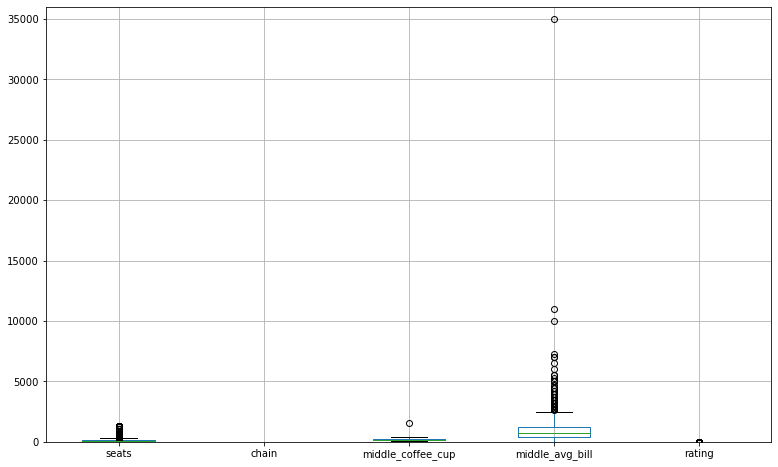

In [8]:
plt.figure(figsize=(13, 8))
df.boxplot(column=['seats','chain', 'middle_coffee_cup', 'middle_avg_bill', 'rating']);
plt.ylim([0,36000])

Изучим явно выбивающийся из значения среднего чека ресторан со средним чеков в 35000:

In [9]:
df.query('middle_avg_bill == 35000')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
7177,кафе,ресторан,"москва, каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.65745,37.646665,4.1,высокие,средний счёт:20000–50000 ₽,35000.0,NaN,0,100.0


Похоже на аномалию, к тому же по данному располагается больница... Сомневаюсь, что в местной столовой такие цены, а идея про тайный ресторан, в котором на первое блюда "ножки покойника в собственном соку" кажется неестественной (кажется же?), поэтому удалим строку:

In [10]:
df = df.loc[(df['middle_avg_bill']<35000.0) | (df['middle_avg_bill'].isna())].reset_index(drop=True)

Аналогично посмотрим выброс со средней стоимостью кофе и уберем ее в случае подтверждения аномалии:

In [11]:
df.query('middle_coffee_cup > 1000')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2859,шоколадница,кофейня,"москва, большая семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0


In [12]:
df = df.loc[(df['middle_coffee_cup']<=1000.0) | (df['middle_coffee_cup'].isna())].reset_index(drop=True)

Рассмотрим выбросы в столбце seats:

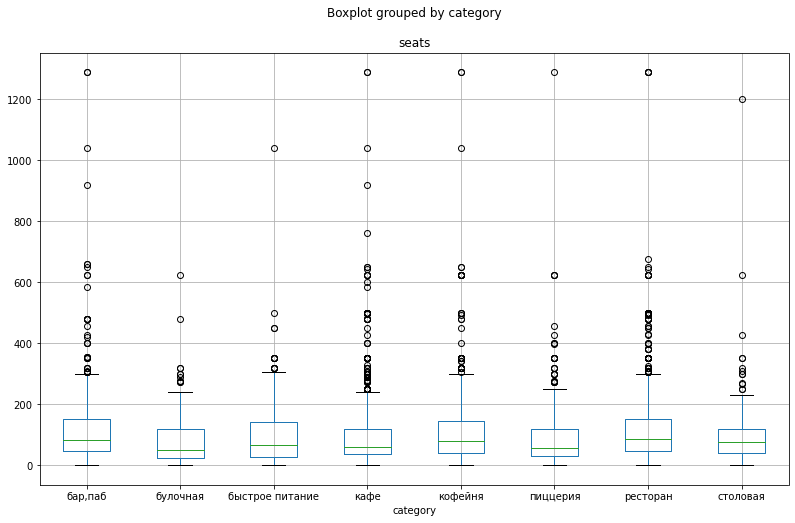

In [13]:
df.boxplot(column='seats', by='category', figsize=(13, 8))
plt.show()

Слишком много заведений с сомнительно большим количеством посадочных мест. Похоже на аномалию. Подсчитаем колчиество, взяв за лимит - 700 посадочных мест, чтобы не рисковать. 

In [14]:
print('Количество мест больше 700:', df[df['seats'] > 600]['name'].count())

Количество мест больше 700: 53


Незначительно количество данных, провоцирующих аномальные выбросы. Избавимся от них:

In [15]:
df = df.loc[(df['seats']<=700.0) | (df['seats'].isna())].reset_index(drop=True)

Займемся столбцом с названиями.

In [16]:
print('Количество уникальных названий:', df['name'].nunique())

Количество уникальных названий: 5502


Проверим, есть ли совпадения по адресу и названию:

In [17]:
key = ['name', 'address']
df.groupby(key)['name'].count().sort_values(ascending=False).head(5)

name                       address                                
кафе                       москва, парк ангарские пруды               2
хлеб да выпечка            москва, ярцевская улица, 19                2
раковарня клешни и хвосты  москва, проспект мира, 118                 2
more poke                  москва, волоколамское шоссе, 11, стр. 2    2
на углях                   москва, ярцевская улица, 22а, корп. 2      1
Name: name, dtype: int64

In [18]:
df[df.duplicated(subset=['name', 'address'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3104,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Удалим повторяющиеся строки:

In [19]:
df = df.drop_duplicates(['name', 'address'])

Займемся столбцом с категориями.

In [20]:
df['category'].value_counts()

кафе               2371
ресторан           2037
кофейня            1409
бар,паб             760
пиццерия            632
быстрое питание     602
столовая            314
булочная            256
Name: category, dtype: int64

Проработка не требуется. 

Создадим столбец street с названиями улиц из столбца с адресом:


In [21]:
df['street'] = df['address'].str.split(', ').apply(lambda x: x[1])

Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
- логическое значение True — если заведение работает ежедневно и круглосуточно;
- логическое значение False — в противоположном случае.

In [22]:
df['is_24/7'] = df['hours'].str.contains('ежедневно, круглосуточно')

В ходе предобработки данных была проведена проверка на наличие дубликатов и пропусков. Решено, что пропуски оставим без изменений во всех столбцах. Также были созданы 2 дополнительных столбца: street - с названиями улиц, на которых расположены заведения и is_24/7 - с разделением на круглосуточные и другие заведения.

In [23]:
df.isna().mean()

name                 0.000000
category             0.000000
address              0.000000
district             0.000000
hours                0.063238
lat                  0.000000
lng                  0.000000
rating               0.000000
price                0.605298
avg_bill             0.545520
middle_avg_bill      0.624985
middle_coffee_cup    0.936284
chain                0.000000
seats                0.430736
street               0.000000
is_24/7              0.063238
dtype: float64

### Анализ данных

Какие категории заведений представлены в данных? Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. Ответим на вопрос о распределении заведений по категориям.

In [24]:
category_name = df.groupby('category').agg({'category':'count'})
category_name = category_name.rename(columns={'category':'cnt'})
category_name['ratio'] = round((category_name['cnt']/category_name['cnt'].sum())*100,2)
category_name = category_name.sort_values(by='ratio', ascending=False)
category_name

,cnt,ratio
category,,
кафе,2371,28.29
ресторан,2037,24.30
кофейня,1409,16.81
"бар,паб",760,9.07
пиццерия,632,7.54
быстрое питание,602,7.18
столовая,314,3.75
булочная,256,3.05


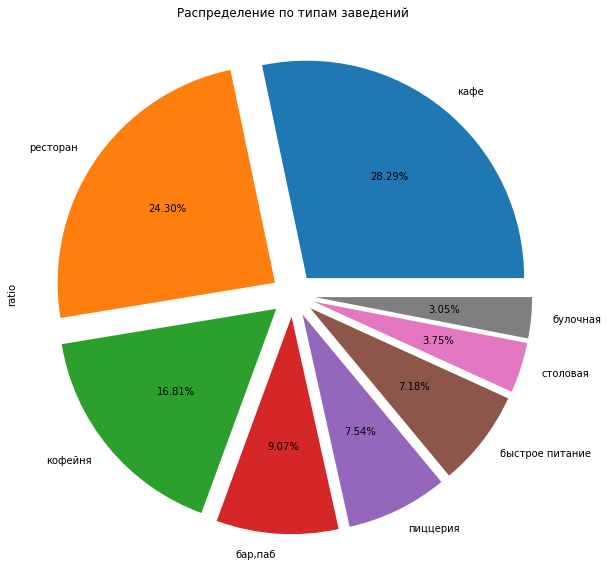

In [25]:
category_name.plot(y='ratio',
                   explode =(0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1),
                   kind='pie',
                   legend=False,
                   figsize=(20,10),
                   autopct='%1.2f%%',
                   title = 'Распределение по типам заведений')
plt.show()

Как видим, более 50% из представленных точек общественного питания занимают кафе (2371) и рестораны (2037). Далее идут кофейни (почти 1409), потом уже все остальные категории заведений.

Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. Проанализируем результаты и сделаем выводы.

In [26]:
df.groupby('category')['seats'].describe().round(2)

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
"бар,паб",463.0,115.76,110.15,0.0,48.00,80.0,142.00,660.0
булочная,148.0,89.39,97.69,0.0,25.00,50.0,120.00,625.0
быстрое питание,348.0,96.19,94.02,0.0,27.25,65.0,136.25,500.0
кафе,1212.0,93.40,99.75,0.0,35.00,60.0,115.25,650.0
кофейня,747.0,106.89,107.41,0.0,40.00,80.0,144.00,650.0
пиццерия,426.0,91.69,96.32,0.0,30.00,53.5,120.00,625.0
ресторан,1264.0,118.22,105.19,0.0,48.00,86.0,150.00,675.0
столовая,163.0,93.00,87.70,0.0,40.00,75.0,116.00,625.0


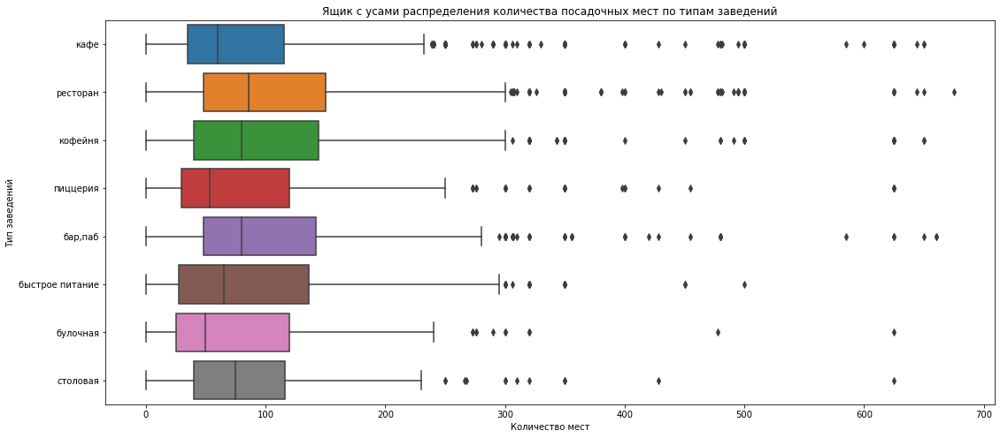

In [27]:
plt.figure(figsize=(18, 8))
ax = sns.boxplot(data=df, x='seats', y='category')
plt.title('Ящик с усами распределения количества посадочных мест по типам заведений')
plt.xlabel('Количество мест')
plt.ylabel('Тип заведений')
plt.show()

Среднее количество мест - около 100 или чуть ниже. У кафе этот показатель на уровне 75-80 мест.

Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [28]:
df_chain = df['chain'].value_counts().reset_index()
df_chain.columns = ['chain', 'count']

fig = go.Figure(data=[go.Pie(labels=['несетевые', 'сетевые'], values=df_chain['count'])], layout=go.Layout(
        title=go.layout.Title(text="Соотношение сетевых и несетевых заведений")))
fig.show()

В Москве 62% заведений не являются сетевыми.

Какие категории заведений чаще являются сетевыми? Исследуем данные и ответим на вопрос графиком.

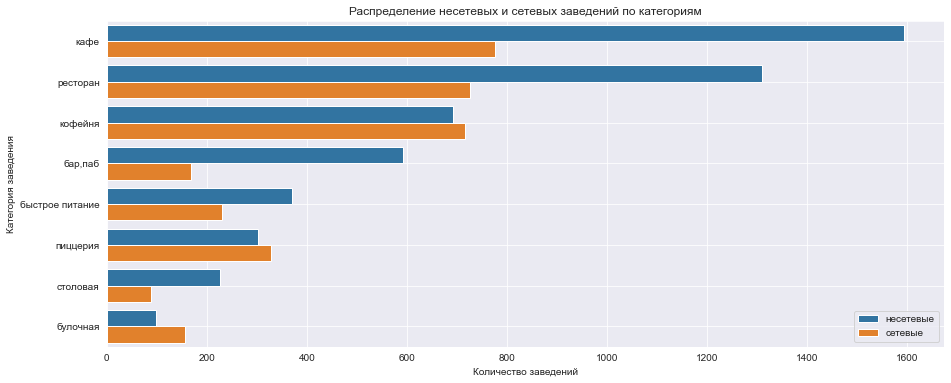

In [29]:
df_chain_categories = df\
.groupby(['category', 'chain'],as_index = False)[['name']]\
.count()\
.sort_values(by='name', ascending=False)

sns.set_style('dark')

plt.figure(figsize=(15, 6))

sns.barplot(x='name', y='category', data=df_chain_categories, hue=df_chain_categories['chain'].map({0:"несетевые",1:"сетевые"}))

plt.title('Распределение несетевых и сетевых заведений по категориям')
plt.xlabel('Количество заведений')
plt.ylabel('Категория заведения')
plt.legend(loc='lower right', fontsize=10)
plt.grid()
plt.show()

Больше всего сетевых заведений: булочная, пиццерия, кофейня.

Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Построим подходящую для такой информации визуализацию. Есть ли какой-то признак, который объединяет сети? 

In [30]:
data_chain_name = df.pivot_table(index=['name','category'], values='chain', aggfunc='sum').reset_index()
data_chain_name = data_chain_name.sort_values(by='chain', ascending=False)
data_chain_name_top = data_chain_name.head(15)
data_chain_name_top

,name,category,chain
5856,шоколадница,кофейня,117
2706,домино'с пицца,пиццерия,76
2672,додо пицца,пиццерия,74
1198,one price coffee,кофейня,70
5932,яндекс лавка,ресторан,68
426,cofix,кофейня,65
1339,prime,ресторан,49
3408,кофепорт,кофейня,42
3472,кулинарная лавка братьев караваевых,кафе,39
5064,теремок,ресторан,36


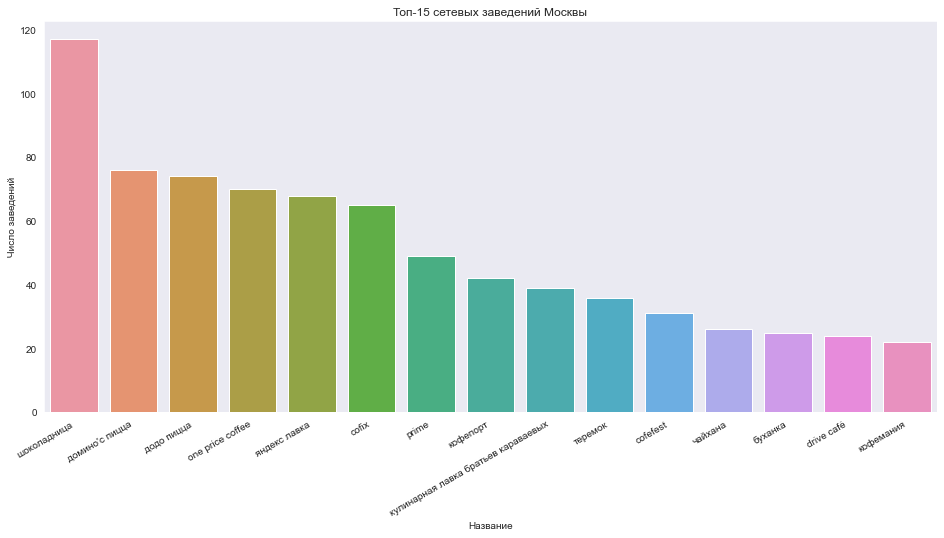

In [31]:
fig = plt.figure(figsize=(16, 8))
ax = sns.barplot(x='name', y='chain', data=data_chain_name_top)
plt.xlabel('Название')
plt.ylabel('Число заведений')
plt.title('Топ-15 сетевых заведений Москвы')
fig.autofmt_xdate()
plt.show()

Самое популярное заведение - "Шоколадница". Заведения, вошедшие в Топ-15 в основном нацелены на быстрый прием пищи, занимают небольшие площади и/или работают на доставку. К какой категории заведений они относятся? 

In [32]:
data_chain_category = data_chain_name_top.pivot_table(index=['category'], values='chain', aggfunc='sum').reset_index()
data_chain_category = data_chain_category.sort_values(by='chain', ascending=False)
data_chain_category

,category,chain
2,кофейня,347
4,ресторан,153
3,пиццерия,150
1,кафе,89
0,булочная,25


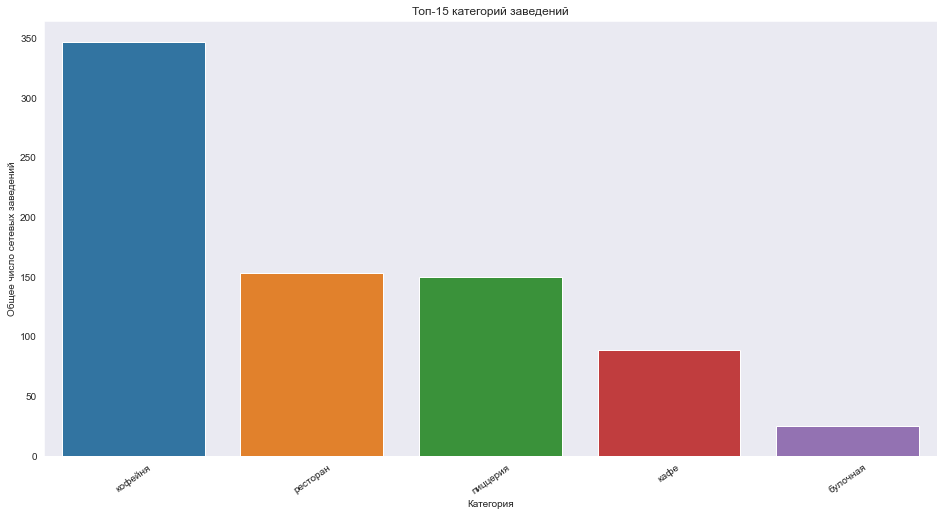

In [33]:
plt.figure(figsize=(16, 8))
ax = sns.barplot(x='category', y='chain', data=data_chain_category)
plt.xlabel('Категория')
plt.ylabel('Общее число сетевых заведений')
plt.title('Топ-15 категорий заведений')
ax.set_xticklabels(ax.get_xticklabels(),rotation = 35)
plt.show()

Наиболее популярной категорией среди ТОП-15 популярных сетей является "кофейня", далее второе место делят ресторан и пиццерия.

Отобразим общее количество заведений и количество заведений каждой категории по районам.

In [34]:
data_top15 = df.loc[df['name'].isin(data_chain_name_top['name'])&
                            df['category'].isin(data_chain_name_top['category'])]
data_chain_district = data_top15.pivot_table(index='category', values='chain', columns='district', aggfunc='sum').reset_index()
data_chain_district.columns=['category','ВАО','ЗАО','САО','СВАО','СЗАО','ЦАО','ЮВАО','ЮЗАО','ЮАО']
data_chain_district


,category,ВАО,ЗАО,САО,СВАО,СЗАО,ЦАО,ЮВАО,ЮЗАО,ЮАО
0,булочная,1.0,5.0,8.0,6.0,3.0,1.0,NaN,1.0,NaN
1,кафе,2.0,13.0,9.0,5.0,1.0,37.0,11.0,9.0,6.0
2,кофейня,28.0,44.0,43.0,37.0,20.0,106.0,15.0,26.0,34.0
3,пиццерия,20.0,15.0,20.0,19.0,13.0,8.0,16.0,16.0,23.0
4,ресторан,15.0,15.0,12.0,14.0,5.0,49.0,11.0,17.0,25.0


In [35]:
fig = px.bar(data_chain_district, x=['ВАО','ЗАО','САО','СВАО','СЗАО','ЦАО','ЮВАО','ЮЗАО','ЮАО'], y='category',
             title='Распределение по районам и типам заведений из Топ-15')
fig.update_layout(xaxis_title='Количество заведений',
                  yaxis_title='Категории')
fig.update_layout(barmode='stack', yaxis={'categoryorder':'total ascending'})
fig.show()

Какие административные районы Москвы присутствуют в датасете? 

In [36]:
district_category = df.pivot_table(index = 'district',
                                   columns = 'category',
                                   values = 'name',
                                   aggfunc = 'count').reset_index()
district_category

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Восточный административный округ,52,25,70,270,103,72,160,40
1,Западный административный округ,47,37,62,235,148,70,214,23
2,Северный административный округ,68,39,58,234,193,77,188,41
3,Северо-Восточный административный округ,62,28,82,269,159,68,182,40
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18
5,Центральный административный округ,364,50,87,464,428,113,670,66
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17
8,Южный административный округ,68,25,85,264,131,73,201,44


Отобразите общее количество заведений и количество заведений каждой категории по районам. 

In [37]:
# отобразим общее количество заведений по районам 
shop_total = (df.groupby('district')['chain'].agg('count').sort_values(ascending=False).to_frame().reset_index())
shop_total

,district,chain
0,Центральный административный округ,2242
1,Северный административный округ,898
2,Южный административный округ,891
3,Северо-Восточный административный округ,890
4,Западный административный округ,836
5,Восточный административный округ,792
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Северо-Западный административный округ,409


In [38]:
fig = px.bar(shop_total.sort_values(by='chain', ascending=True), x='chain', y='district', text='chain')
fig.update_layout(title='Количество заведений по районам', xaxis_title='Количество заведений', yaxis_title='Район москвы')
fig.show() 

In [39]:
total_district_category = district_category.merge(shop_total, on='district')
total_district_category.sort_values(by='chain', ascending=True)

,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,chain
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18,409
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
0,Восточный административный округ,52,25,70,270,103,72,160,40,792
1,Западный административный округ,47,37,62,235,148,70,214,23,836
3,Северо-Восточный административный округ,62,28,82,269,159,68,182,40,890
8,Южный административный округ,68,25,85,264,131,73,201,44,891
2,Северный административный округ,68,39,58,234,193,77,188,41,898
5,Центральный административный округ,364,50,87,464,428,113,670,66,2242


In [40]:
name_c = ['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан','столовая']
name_d = ['Северо-Западный административный округ', 'Юго-Западный административный округ', 'Юго-Восточный административный округ', 'Восточный административный округ', 'Западный административный округ', 'Северо-Восточный административный округ', 'Южный административный округ', 'Северный административный округ', 'Центральный административный округ']
fig = px.bar(total_district_category.sort_values(by='chain', ascending=True), x=name_c, y=name_d, width=1000, height=1000,title="Распределение категории заведений по районам Москвы", text='value')
fig.show()

Визуализируем распределение средних рейтингов по категориям заведений.

In [41]:
rating_df = (df.groupby('category')['rating']
          .agg('mean').
          sort_values(ascending=False)
          .reset_index()
          )

rating_df

,category,rating
0,"бар,паб",4.387895
1,пиццерия,4.300475
2,ресторан,4.290574
3,кофейня,4.277431
4,булочная,4.268359
5,столовая,4.211465
6,кафе,4.123956
7,быстрое питание,4.049834


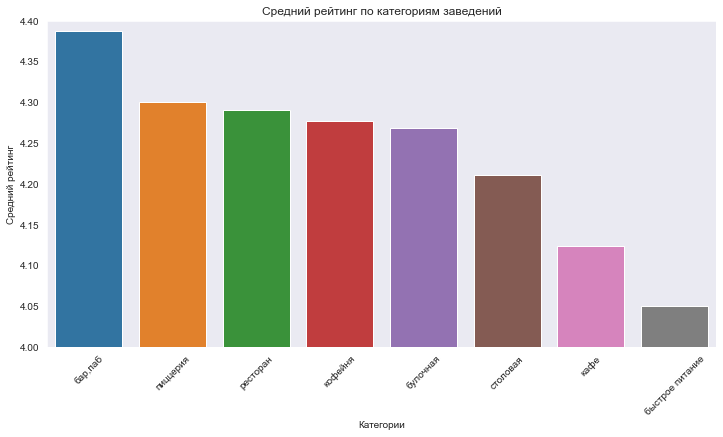

In [42]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='category', y='rating', data=rating_df)
plt.xlabel('Категории')
plt.ylabel('Средний рейтинг')
plt.title('Средний рейтинг по категориям заведений')
plt.ylim(4,4.4)
ax.set_xticklabels(ax.get_xticklabels(),rotation = 45)
plt.show()

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [43]:
district_rating = df.groupby('district', as_index=False)['rating'].agg('mean')
district_rating['rating'] = round(district_rating['rating'],2)
district_rating

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [44]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'C:\\new\\admin_level_geomap.geojson'
with open(state_geo, encoding='utf-8') as f:
    dd = geojson.load(f)
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=dd,
    data=district_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Средний рейтинг не сильно отличается, но в центре средний рейтинг заведений выше всего. Ниже - в ЮВАО. Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [45]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаём маркер в текущей точке и добавляем его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

Наблюдается наибольшее сосредоточение заведений в районе ЦАО.

Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам.

In [46]:
streets_moscow = df[df['street'].notnull()]
top15_streets = streets_moscow['street'].value_counts().reset_index().head(15)
top15_streets.columns = ['street_name', 'count']
#создадим таблицу с названиями улиц и категорий
streets_category = df.groupby(['street', 'category'])['name'].count().reset_index()
streets_category.columns = ['street_name', 'category', 'count']
#оставим только улицы из топ 15
streets15_category = streets_category[streets_category['street_name'].isin(top15_streets['street_name'])]

In [47]:
fig = px.bar(streets15_category, # загружаем данные и заново их сортируем
             x='count', # указываем столбец с данными для оси X
             y='street_name', # указываем столбец с данными для оси Y                  
             color='category'
            )
# оформляем график
fig.update_layout(title='Количество заведений каждой категории по улицам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название улиц',
                   yaxis={'categoryorder':'total ascending'}
                 )
fig.show() # выводим график

Найдем улицы, на которых находится только один объект общепита.

In [48]:
grouped_by_street = df.pivot_table(index=['street'], values ='name', aggfunc = 'count')\
.sort_values(by='name')\
.reset_index()

street_one_rest = grouped_by_street.loc[grouped_by_street['name'] == 1]
print('Улиц с одним заведением общепита -', street_one_rest.shape[0])

Улиц с одним заведением общепита - 457


In [49]:
data_low = df.loc[df['street'].isin(street_one_rest['street'])]

In [50]:
m_low = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m_low)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data_low.apply(create_clusters, axis=1)

m_low

Улицы с единственным заведением либо короткие, либо располагаются в промышленных зонах.

Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчием медиану этого столбца для каждого района. Используем это значение в качестве ценового индикатора района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируем цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [51]:
median_bill = df.groupby('district')['middle_avg_bill'].median().reset_index()
median_bill

,district,middle_avg_bill
0,Восточный административный округ,550.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [52]:
# создаём карту Москвы
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=dd,
    data=median_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='GnBu',
    legend_name='Средний чек заведений по районам',
).add_to(m2)

# выводим карту
m2

По данным выше мы видим, что самый высокий средний чек в Центральном и Западном округах. Самый маленький в Юго-Восточном административном округе. 

**ВЫВОД:**
- Более 50% заведений - рестораны и кафе.
- Среднее количество мест - около 100 или чуть ниже. У кафе этот показатель на уровне 75-80 мест.
- 62% заведений - сетевые.
- Самой распространненной сетью в Москве является "Шоколадница". Кофейни - явные лидеры среди сетевых заведений из Топ-15. 
- В центре Москвы средний рейтинг заведений наивысший.
- Наибольшее сосредоточение заведений питания в районе ЦАО.
- Улицы с единственным заведением либо короткие, либо располагаются в промышленных зонах.
- Самый высокий средний чек в Центральном и Западном округах, самый маленький в Юго-Восточном административном округе.

### Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную как «Central Perk» кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

Сколько всего кофеен в датасете?

In [53]:
print('Число кофеен в датасете -', df.loc[df['category'] == 'кофейня', 'name'].count())

Число кофеен в датасете - 1409


В каких районах их больше всего, каковы особенности их расположения?

In [54]:
coffee_house = df.query('category == "кофейня"')
coffee_house_district = coffee_house.groupby('district')['name'].count()
coffee_house_district

district
Восточный административный округ           103
Западный административный округ            148
Северный административный округ            193
Северо-Восточный административный округ    159
Северо-Западный административный округ      62
Центральный административный округ         428
Юго-Восточный административный округ        89
Юго-Западный административный округ         96
Южный административный округ               131
Name: name, dtype: int64

In [55]:
# создаём карту Москвы
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=dd,
    data=coffee_house_district,
    columns=['district', 'cnt'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Число кофеен по районам',
).add_to(m2)

# выводим карту
m2

Есть ли круглосуточные кофейни?

In [56]:
data_coffee_allday = coffee_house.loc[coffee_house['is_24/7']==True]
print('Число круглосуточных кофеен в датасете -', len(data_coffee_allday))

Число круглосуточных кофеен в датасете - 59


Какие у кофеен рейтинги? 

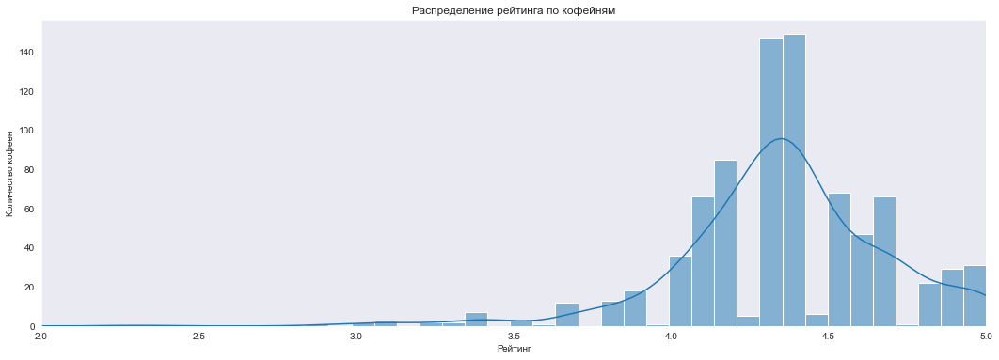

In [57]:
coffee_house = df.query('category == "кофейня"')
coffee_house_rating = coffee_house.pivot_table(index = 'name', values = 'rating', aggfunc = 'median').reset_index()

plt.figure(figsize = (18,6))

sns.histplot(x='rating', data=coffee_house_rating, kde=True, bins=50)

plt.xlim(2, 5)
plt.title('Распределение рейтинга по кофейням')
plt.xlabel('Рейтинг')
plt.ylabel('Количество кофеен')
plt.show()

Как они распределяются по районам?

In [58]:
coffee_house_rating = coffee_house.groupby('district')['rating'].mean()
coffee_house_rating

district
Восточный административный округ           4.285437
Западный административный округ            4.193919
Северный административный округ            4.291710
Северо-Восточный административный округ    4.216981
Северо-Западный административный округ     4.325806
Центральный административный округ         4.336449
Юго-Восточный административный округ       4.225843
Юго-Западный административный округ        4.283333
Южный административный округ               4.232824
Name: rating, dtype: float64

In [59]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'C:\\new\\admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
l = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=dd,
    data=coffee_house_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофейн по районам',
).add_to(l)

# выводим карту
l

Наиболее высокие рейтинги в категории "кофейня" у районов ЦАО и СВАО.

На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [60]:
data_cup = coffee_house.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean')
data_cup.columns = ['district', 'mean_cup']
data_cup = data_cup.sort_values(by='mean_cup', ascending=False)
data_cup

,district,mean_cup
1,Западный административный округ,189.938776
5,Центральный административный округ,187.518519
7,Юго-Западный административный округ,184.176471
2,Северный административный округ,165.789474
4,Северо-Западный административный округ,165.523810
3,Северо-Восточный административный округ,165.333333
8,Южный административный округ,158.488372
6,Юго-Восточный административный округ,151.088235
0,Восточный административный округ,140.024390


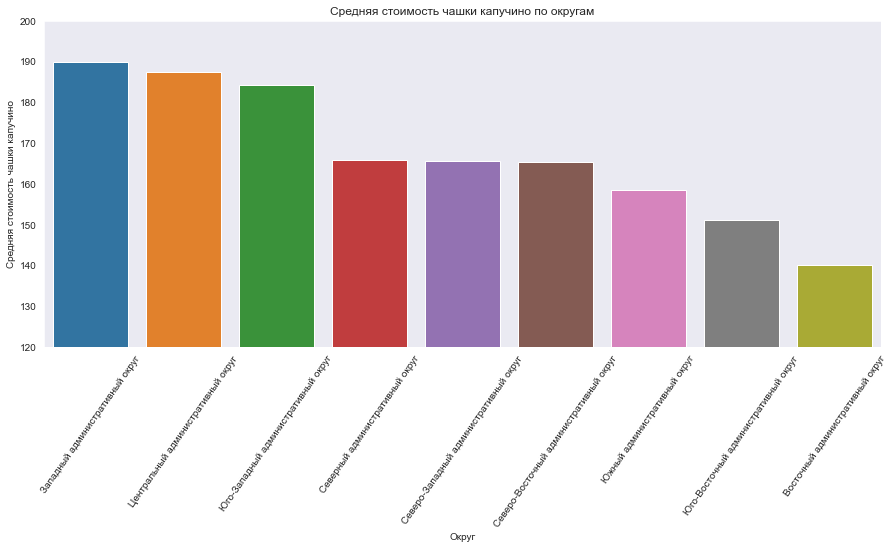

In [61]:
plt.figure(figsize=(15,6))
ax = sns.barplot(x='district', y='mean_cup', data=data_cup)
plt.xlabel('Округ')
plt.ylabel('Средняя стоимость чашки капучино')
plt.title('Средняя стоимость чашки капучино по округам')
plt.ylim(120,200)
ax.set_xticklabels(ax.get_xticklabels(),rotation = 55)
plt.show()

Самая дорогая чашка кофе в районе ЗАО, ЦАО и ЮЗАО (180-190 рублей), самое дешевое кофе - в ВАО (140-150 рублей).

Рекомендации для кофейни:

Местоположение - САО или ЗАО. Лезть в ЦАО при такой конкуренции - дело гиблое, если вы не гуру кофейного бизнеса. Но в ЗАО есть вадный показатель - здесь можно сразу выставить довольно высокую стоимость кофе, потому что в этом районе средняя цена чашки капучино самая дорогая во всей Москве. К тому же, количество конкурентов в ЗАО очень невелико (всего 148), к тому же средний рейтинг заведений один из самых низких по столице. При качественном уровне сервиса кофейня может окупиться довольно быстро, но надо обязательно подобрать место с учетом проходимости людей и близости многочисленных бизнес и торгово-развлекательных центров в районе. Также следует рассмотреть вариант открытия круглосуточного кафе, возможно в будние дни или, наоборот, только в выходные. 